In [316]:
import warnings
warnings.simplefilter("ignore")

import numpy as np
import pandas as pd
import folium
import branca
import branca.colormap as cm
from folium import plugins
from folium.plugins import HeatMap
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import random
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
import statsmodels.api as sm
from sklearn.metrics import roc_auc_score,accuracy_score, f1_score


from sklearn.cluster import KMeans, AgglomerativeClustering, Birch
from sklearn.metrics import silhouette_score
from itertools import combinations
center = (37.1623799231016, 127.05436890115905)
# plt.style.use(['ggplot'])
rs = 123
np.random.seed(rs)
random.seed(rs)

# 회귀분석 결과 확인

In [317]:
data25 = pd.read_csv("data/feature25.csv")
data50 = pd.read_csv("data/feature50.csv")
cluster25 = pd.read_csv("data/kmeans_cluster25.csv").iloc[:,0]
cluster50 = pd.read_csv("data/kmeans_cluster50.csv").iloc[:,0]

data25['is_bump20'] = data25['shortest_bump_dist'] < 20
data25['is_bump40'] = data25['shortest_bump_dist'] < 40
data50['is_bump20'] = data50['shortest_bump_dist'] < 20
data50['is_bump40'] = data50['shortest_bump_dist'] < 40

data25['is_sidewalk12.5'] = data25['shortest_sidewalk_dist'] < 12.5
data25['is_sidewalk25'] = data25['shortest_sidewalk_dist'] < 25
data50['is_sidewalk12.5'] = data50['shortest_sidewalk_dist'] < 12.5
data50['is_sidewalk25'] = data50['shortest_sidewalk_dist'] < 25

col = {"x_common": ['overspeed_cam_count100', 'floating_pop_count50','car_count1000', 'child_count1000', 
                  'elem_kinder_count400','num_cram_school_count400', 
                  'shortest_cross_dist','shortest_traffic_signal_dist',], # 'numberSchoolZone_count400'
       "x_25" : ['is_bump20', 'parking_count12.5','is_sidewalk12.5', 'barrier_nearby_count12.5',
                   'chaos1_nearby_count12.5', 'width_nearby_count12.5','cross_road_nearby_count12.5',
                   ],
       "x_50" : ['is_bump40', 'parking_count25','is_sidewalk25', 'barrier_nearby_count25',
                   'chaos1_nearby_count25', 'width_nearby_count25','cross_road_nearby_count25'],
       "y_25" : 'accident_count12.5',
       "y_50" : 'accident_count25',}

In [318]:
dup = ["numberSchoolZone_count400"]
protection = ["barrier_nearby_count12.5", "barrier_nearby_count25", "shortest_cross_dist",
             "overspeed_cam_count100",  "shortest_traffic_signal_dist","is_bump40","is_bump20", 
              "is_sidewalk12.5", "is_sidewalk25",]
p_value = ["car_count1000", "child_count1000", "chaos1_nearby_count12.5", "chaos1_nearby_count25"]
del_col = protection + p_value + dup
xy25 = data25[col["x_common"] + col["x_25"] +[col['y_25']]].astype(float)
xy50 = data50[col["x_common"] + col["x_50"] +[col['y_50']]].astype(float)
xy25[col['y_25']] = (xy25[col['y_25']] > 0).astype(float)
xy50[col['y_50']] = (xy50[col['y_50']] > 0).astype(float)

# fit_transform -> 한꺼번에 가능
scaler = MinMaxScaler()
xy50.loc[:,:] = scaler.fit_transform(xy50)
xy25.loc[:,:] = scaler.transform(xy25)


x50, y50 = xy50.iloc[:,:-1], xy50.iloc[:,-1]
x25, y25 = xy25.iloc[:,:-1], xy25.iloc[:,-1]
x50 = x50.loc[:,~np.isin(x50.columns,del_col)]
x25 = x25.loc[:,~np.isin(x25.columns,del_col)]


model = sm.Logit(y50,sm.add_constant(x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(x25,has_constant = "add"))
print("auc_roc:", roc_auc_score(y25.astype(int),predictions))
print("accuracy:",accuracy_score(y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
base_coef = pd.DataFrame(results.params.to_frame().reset_index().values, columns = ["x", "effect"])[1:]
results.summary2()


auc_roc: 0.7534050772056416
accuracy: 0.9742011524358303
f1: 0.0


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Results: Logit
==========================================================================
Model:                  Logit               Pseudo R-squared:    0.123    
Dependent Variable:     accident_count25    AIC:                 1558.7823
Date:                   2021-01-24 17:34    BIC:                 1558.7823
No. Observations:       3912                Log-Likelihood:      -779.39  
Df Model:               -1                  LL-Null:             -888.67  
Df Residuals:           3912                LLR p-value:         nan      
Converged:              1.0000              Scale:               1.0000   
No. Iterations:         25.0000                                           
--------------------------------------------------------------------------
                           Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
--------------------------------------------------------------------------
const                     -4.3438   0.1936 -22.4426 0.0000 -4.7232 -3.9645
floating_pop_count50       2.0908   0.4942   4.2308 0.0000  1.1222  3.0594
elem_kinder_count400       2.4243   0.3687   6.5758 0.0000  1.7017  3.1469
num_cram_school_count400   1.2915   0.3446   3.7475 0.0002  0.6160  1.9670
parking_count25            3.2070   1.0670   3.0056 0.0027  1.1157  5.2983
width_nearby_count25       0.6529   0.2715   2.4052 0.0162  0.1209  1.1850
cross_road_nearby_count25  2.2230   0.4907   4.5301 0.0000  1.2612  3.1848
==========================================================================

"""

In [319]:
i = (0,) # (0,2)
index_bool50 = np.isin(cluster50,i)
index_bool25 = np.isin(cluster25,i)
tmp_x50, tmp_y50 = x50[index_bool50], y50[index_bool50]
tmp_x25, tmp_y25 = x25[index_bool25], y25[index_bool25]

model = sm.Logit(tmp_y50,sm.add_constant(tmp_x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(tmp_x25,has_constant = "add"))

print("auc_roc:", roc_auc_score(tmp_y25.astype(int),predictions))
print("accuracy:",accuracy_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
cluster0_coef = pd.DataFrame(results.params.to_frame().reset_index().values, columns = ["x", "effect"])[1:]
results.summary2()

auc_roc: 0.7119415952932602
accuracy: 0.9624034911043975
f1: 0.034482758620689655


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Results: Logit
==========================================================================
Model:                 Logit               Pseudo R-squared:    0.133     
Dependent Variable:    accident_count25    AIC:                 800.8667  
Date:                  2021-01-24 17:34    BIC:                 838.7940  
No. Observations:      1666                Log-Likelihood:      -393.43   
Df Model:              6                   LL-Null:             -453.90   
Df Residuals:          1659                LLR p-value:         1.0365e-23
Converged:             1.0000              Scale:               1.0000    
No. Iterations:        26.0000                                            
--------------------------------------------------------------------------
                           Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
--------------------------------------------------------------------------
const                     -4.1955   0.2838 -14.7844 0.0000 -4.7517 -3.6393
floating_pop_count50       2.3174   0.6650   3.4847 0.0005  1.0140  3.6208
elem_kinder_count400       1.7180   0.5200   3.3040 0.0010  0.6989  2.7372
num_cram_school_count400   1.6837   0.4254   3.9580 0.0001  0.8500  2.5175
parking_count25            5.8067   1.5936   3.6437 0.0003  2.6833  8.9302
width_nearby_count25       0.8036   0.4122   1.9493 0.0513 -0.0044  1.6115
cross_road_nearby_count25  2.6356   0.7597   3.4694 0.0005  1.1467  4.1245
==========================================================================

"""

In [320]:
i = (3,)
index_bool50 = np.isin(cluster50,i)
index_bool25 = np.isin(cluster25,i)
tmp_x50, tmp_y50 = x50[index_bool50], y50[index_bool50]
tmp_x25, tmp_y25 = x25[index_bool25], y25[index_bool25]

model = sm.Logit(tmp_y50,sm.add_constant(tmp_x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(tmp_x25,has_constant = "add"))

print("auc_roc:", roc_auc_score(tmp_y25.astype(int),predictions))
print("accuracy:",accuracy_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
cluster3_coef = pd.DataFrame(results.params.to_frame().reset_index().values, columns = ["x", "effect"])[1:]
results.summary2()



auc_roc: 0.8188370188370189
accuracy: 0.9728783902012248
f1: 0.1142857142857143


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Results: Logit
=========================================================================
Model:                  Logit              Pseudo R-squared:   0.150     
Dependent Variable:     accident_count25   AIC:                352.8499  
Date:                   2021-01-24 17:34   BIC:                385.8321  
No. Observations:       822                Log-Likelihood:     -169.42   
Df Model:               6                  LL-Null:            -199.21   
Df Residuals:           815                LLR p-value:        5.4780e-11
Converged:              1.0000             Scale:              1.0000    
No. Iterations:         31.0000                                          
-------------------------------------------------------------------------
                           Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
-------------------------------------------------------------------------
const                     -4.2082   0.6538 -6.4361 0.0000 -5.4897 -2.9267
floating_pop_count50       1.2962   1.0957  1.1830 0.2368 -0.8513  3.4436
elem_kinder_count400       4.1566   0.8172  5.0867 0.0000  2.5550  5.7582
num_cram_school_count400  -0.2427   0.8464 -0.2868 0.7743 -1.9016  1.4162
parking_count25            0.2018   4.5946  0.0439 0.9650 -8.8035  9.2071
width_nearby_count25       0.0342   0.7563  0.0452 0.9640 -1.4481  1.5164
cross_road_nearby_count25  2.0539   1.0232  2.0073 0.0447  0.0484  4.0594
=========================================================================

"""

In [321]:
i = (3,)
index_bool50 = np.isin(cluster50,i)
index_bool25 = np.isin(cluster25,i)
tmp_x50, tmp_y50 = x50.loc[index_bool50,["elem_kinder_count400","cross_road_nearby_count25"]], y50[index_bool50]
tmp_x25, tmp_y25 = x25.loc[index_bool25,["elem_kinder_count400","cross_road_nearby_count12.5"]], y25[index_bool25]

model = sm.Logit(tmp_y50,sm.add_constant(tmp_x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(tmp_x25,has_constant = "add"))

print("auc_roc:", roc_auc_score(tmp_y25.astype(int),predictions))
print("accuracy:",accuracy_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
cluster3_coef = pd.DataFrame(results.params.to_frame().reset_index().values, columns = ["x", "effect"])[1:]
results.summary2()

auc_roc: 0.8175948675948675
accuracy: 0.9728783902012248
f1: 0.1142857142857143


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Results: Logit
==========================================================================
Model:                 Logit               Pseudo R-squared:    0.146     
Dependent Variable:    accident_count25    AIC:                 346.1604  
Date:                  2021-01-24 17:34    BIC:                 360.2956  
No. Observations:      822                 Log-Likelihood:      -170.08   
Df Model:              2                   LL-Null:             -199.21   
Df Residuals:          819                 LLR p-value:         2.2230e-13
Converged:             1.0000              Scale:               1.0000    
No. Iterations:        16.0000                                            
--------------------------------------------------------------------------
                           Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
--------------------------------------------------------------------------
const                     -4.0902   0.2899 -14.1080 0.0000 -4.6584 -3.5219
elem_kinder_count400       4.2246   0.6231   6.7797 0.0000  3.0033  5.4458
cross_road_nearby_count25  2.1323   0.8850   2.4093 0.0160  0.3977  3.8669
==========================================================================

"""

## 어린이 보호구역

In [322]:
index_bool50 = data50['numberSchoolZone_count400'] > 1e-6
index_bool25 = data25['numberSchoolZone_count400'] > 1e-6
tmp_x50, tmp_y50 = x50.loc[index_bool50,], y50[index_bool50]
tmp_x25, tmp_y25 = x25.loc[index_bool25,], y25[index_bool25]

model = sm.Logit(tmp_y50,sm.add_constant(tmp_x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(tmp_x25,has_constant = "add"))

print("auc_roc:", roc_auc_score(tmp_y25.astype(int),predictions))
print("accuracy:",accuracy_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
results.summary2()

auc_roc: 0.719670586039567
accuracy: 0.9629535650850038
f1: 0.0


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Results: Logit
==========================================================================
Model:                 Logit               Pseudo R-squared:    0.090     
Dependent Variable:    accident_count25    AIC:                 1091.5623 
Date:                  2021-01-24 17:34    BIC:                 1130.7966 
No. Observations:      2008                Log-Likelihood:      -538.78   
Df Model:              6                   LL-Null:             -591.81   
Df Residuals:          2001                LLR p-value:         1.3629e-20
Converged:             1.0000              Scale:               1.0000    
No. Iterations:        29.0000                                            
--------------------------------------------------------------------------
                           Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
--------------------------------------------------------------------------
const                     -3.8348   0.2395 -16.0096 0.0000 -4.3043 -3.3654
floating_pop_count50       3.1231   0.6349   4.9189 0.0000  1.8787  4.3675
elem_kinder_count400       1.9808   0.4686   4.2273 0.0000  1.0624  2.8991
num_cram_school_count400   0.6147   0.4722   1.3019 0.1930 -0.3107  1.5402
parking_count25            5.3949   1.7560   3.0723 0.0021  1.9532  8.8365
width_nearby_count25       0.3555   0.3300   1.0772 0.2814 -0.2913  1.0024
cross_road_nearby_count25  1.6317   0.7306   2.2333 0.0255  0.1997  3.0637
==========================================================================

"""

In [323]:
index_bool50 = data50['numberSchoolZone_count400'] > 1e-6
index_bool25 = data25['numberSchoolZone_count400'] > 1e-6
tmp_x50, tmp_y50 = x50.loc[index_bool50,["floating_pop_count50", "elem_kinder_count400", 
                                         "parking_count25", "cross_road_nearby_count25"]], y50[index_bool50]
tmp_x25, tmp_y25 = x25.loc[index_bool25,["floating_pop_count50", "elem_kinder_count400", 
                                         "parking_count12.5", "cross_road_nearby_count12.5"]], y25[index_bool25]

model = sm.Logit(tmp_y50,sm.add_constant(tmp_x50,has_constant = "add"))
results = model.fit(method= 'lbfgs',maxiter =1000)
predictions = results.predict(sm.add_constant(tmp_x25,has_constant = "add"))

print("auc_roc:", roc_auc_score(tmp_y25.astype(int),predictions))
print("accuracy:",accuracy_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
print("f1:",f1_score(tmp_y25.astype(int),predictions.apply(lambda x: 0 if x <0.5 else 1)))
schoolzone_coef = pd.DataFrame(results.params.to_frame().reset_index().values, columns = ["x", "effect"])[1:]
results.summary2()

auc_roc: 0.7144624860022396
accuracy: 0.9634610504947982
f1: 0.0


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Results: Logit
==========================================================================
Model:                 Logit               Pseudo R-squared:    0.087     
Dependent Variable:    accident_count25    AIC:                 1090.6400 
Date:                  2021-01-24 17:34    BIC:                 1118.6645 
No. Observations:      2008                Log-Likelihood:      -540.32   
Df Model:              4                   LL-Null:             -591.81   
Df Residuals:          2003                LLR p-value:         2.2829e-21
Converged:             1.0000              Scale:               1.0000    
No. Iterations:        27.0000                                            
--------------------------------------------------------------------------
                           Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
--------------------------------------------------------------------------
const                     -3.6946   0.1807 -20.4501 0.0000 -4.0487 -3.3405
floating_pop_count50       3.3773   0.6084   5.5512 0.0000  2.1849  4.5697
elem_kinder_count400       2.3642   0.3663   6.4544 0.0000  1.6463  3.0822
parking_count25            5.5192   1.7656   3.1260 0.0018  2.0587  8.9797
cross_road_nearby_count25  1.5066   0.7211   2.0894 0.0367  0.0933  2.9199
==========================================================================

"""

<AxesSubplot:xlabel='x', ylabel='effect'>

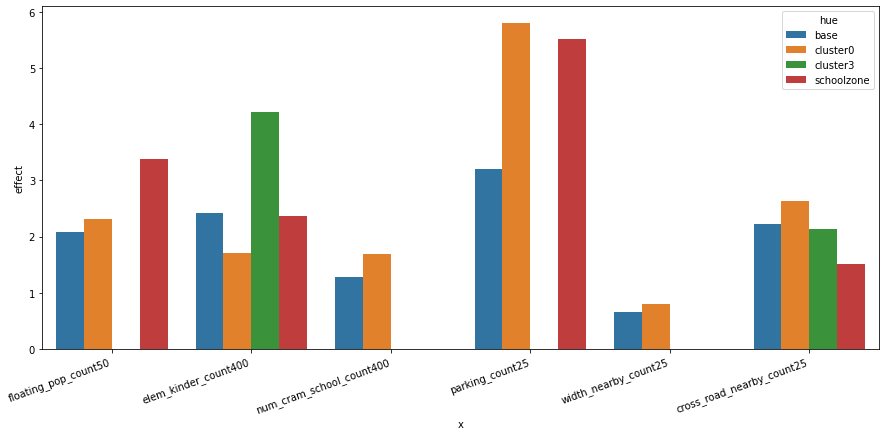

In [324]:
tmp = pd.concat([base_coef.assign(hue="base"),
                 cluster0_coef.assign(hue="cluster0"),
                 cluster3_coef.assign(hue="cluster3"),
                 schoolzone_coef.assign(hue="schoolzone"),])
# sns.barplot(data= ,x = "x", y = "effect", hue = "hue")
fig,ax = plt.subplots(figsize = (15,7))
fig.autofmt_xdate(rotation=20)
sns.barplot(data = tmp, x = "x", y = "effect", hue = "hue", ax=ax, )

# cluster 기반 최적화

In [325]:
tmp_data50 = data25[['floating_pop_count50', 'elem_kinder_count400','num_cram_school_count400', 
                 'parking_count25', 'width_nearby_count25','cross_road_nearby_count25',]].astype(float)

tmp_data25 = data25[['floating_pop_count50', 'elem_kinder_count400','num_cram_school_count400', 
                 'parking_count25', 'width_nearby_count25','cross_road_nearby_count25',]].astype(float)
scaler = MinMaxScaler()
scaler.fit(tmp_data50)
tmp_data25.loc[:,:] = scaler.transform(tmp_data25)

In [326]:
data25["is_cross50"] = data25["shortest_cross_dist"] < 50
data25["is_traffic_signal50"] = data25["shortest_traffic_signal_dist"] < 50

In [327]:
opt_set = pd.concat([tmp_data25,data25[['lat','lon','overspeed_cam_count100', "is_cross50", 
                                        "is_traffic_signal50",'is_bump40','numberSchoolZone_count400']]],axis=1)
opt_set = opt_set.assign(cluster = cluster25, extra50 = 0)

In [328]:
base_coef_mean = base_coef.set_index("x")
cluster3_coef_mean = cluster3_coef.set_index("x")
cluster0_coef_mean = cluster0_coef.set_index("x")
schoolzone_coef_mean = schoolzone_coef.set_index("x")

In [329]:
def cal_danger(x):
    coef_set = [base_coef_mean]
    if x["cluster"] == 3:
        coef_set.append(cluster3_coef_mean)
    if x["cluster"] == 0:
        coef_set.append(cluster0_coef_mean)
    if x['numberSchoolZone_count400'] != 0:
        coef_set.append(schoolzone_coef_mean)
    coef = pd.concat(coef_set,axis=1).mean(axis = 1)
    return (coef * x[coef.index]).sum()    
opt_set["danger"] = opt_set.apply(cal_danger,axis=1)

<AxesSubplot:xlabel='lon', ylabel='lat'>

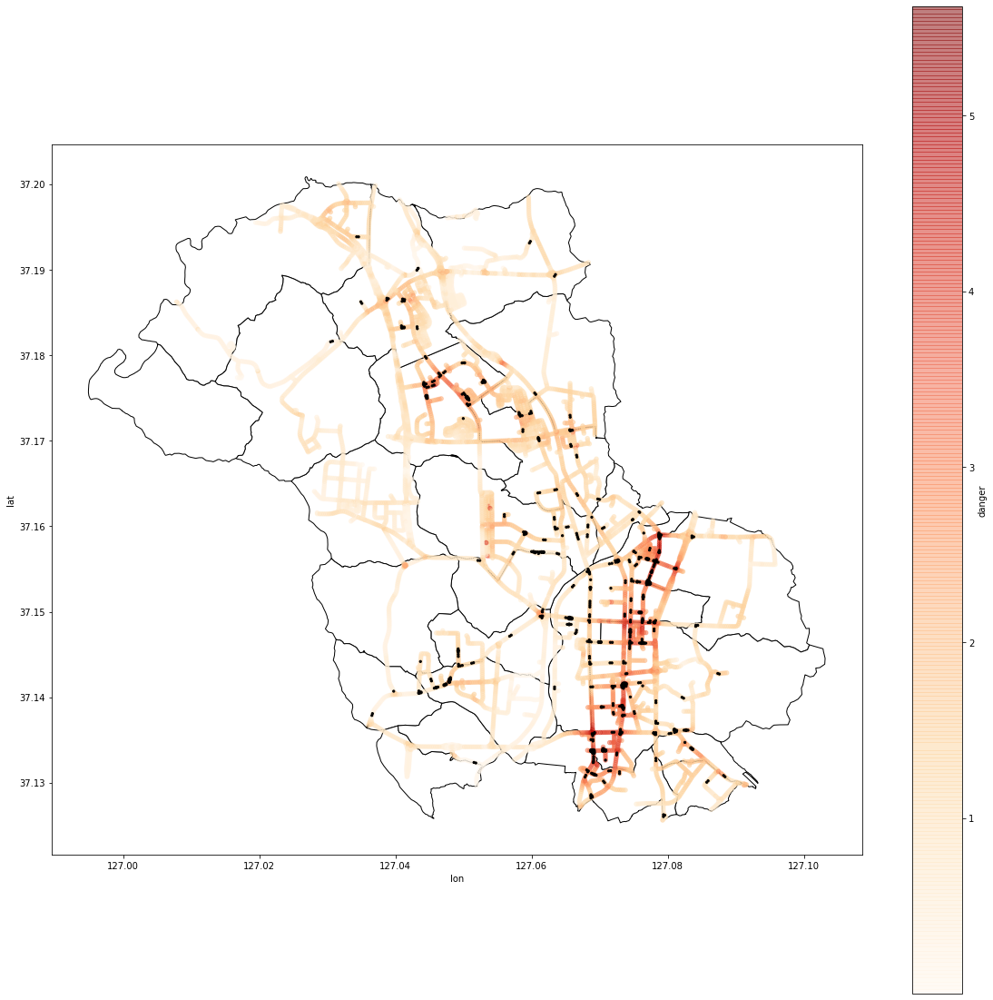

In [330]:
df2 = gpd.read_file('../data/original/33.오산시_법정경계(읍면동).geojson',encoding="utf-8")
fig,ax = plt.subplots(1,1,sharex=True,sharey=True,figsize=(20,20))
df2.plot(ax = ax,color='white', edgecolor='black')
opt_set.plot.scatter(ax= ax, x='lon',y='lat',c = "danger", cmap = 'OrRd',alpha = 0.5, s = 20)
data25.plot.scatter(ax= ax, x='lon',y='lat',s = data25['accident_count25'] * 5,c="black")

In [331]:
def draw_map(danger_data):
    # map
    map1 = folium.Map(location=center, zoom_start=13, control_scale=True)

    # all subgroups
    all_subgroups = folium.FeatureGroup(name='all_thing')
    map1.add_child(all_subgroups)

    #osan
    osan_region = plugins.FeatureGroupSubGroup(all_subgroups, 'osan region')
    map1.add_child(osan_region)
    osan = gpd.read_file('../data/original/31.오산시_법정경계(시군구).geojson ',encoding="utf-8")
    folium.GeoJson(osan, style_function=lambda x:{'fillColor': 'transparent', 'color': 'grey'}).add_to(osan_region)



    colormap = cm.LinearColormap(colors=['skyblue','red'], index=[danger_data["danger"].min(),danger_data["danger"].max()],
                                 vmin = int(danger_data["danger"].min()), vmax = np.ceil(danger_data["danger"].max()))
    danger = plugins.FeatureGroupSubGroup(all_subgroups, 'danger')
    map1.add_child(danger)
    for i in range(0, len(danger_data)):
        folium.Circle(
            location = [danger_data.loc[i,"lat"],
                        danger_data.loc[i,"lon"]],
            radius = 10,
            tooltip=str(),
            fill=True,
#             color = "transparent",
            color = colormap(danger_data.loc[i,"danger"]), #fill_
            alpha = 1.,
        ).add_to(danger)
        # point
    accident_point = plugins.FeatureGroupSubGroup(all_subgroups, 'accident_point')
    map1.add_child(accident_point)
    tmp = pd.read_csv("data/feature25.csv")
    tmp = tmp.loc[tmp["accident_count25"] != 0,['lat','lon',"accident_count25"]]
    for i in tmp.index:
        folium.Circle(
            location = [tmp.loc[i,"lat"],
                        tmp.loc[i,"lon"]],
            color = "black" ,
            
            radius = 3,
            tooltip=str(tmp.loc[i,"accident_count25"]),
        ).add_to(accident_point)
#     HeatMap(tmp).add_to(accident_point)
    folium.LayerControl(collapsed=False).add_to(map1)
    return map1


In [332]:
draw_map(opt_set)

In [426]:
range_dict = {
    'overspeed_cam_count100' : 100,
    'is_bump40' : 40,
    "extra50" : 50,  
#     "is_cross50" : 50,
#     "is_traffic_signal50" : 50,
}
effect = {
    'overspeed_cam_count100' : [0.7, 0.1, 0.05] + [0] * 100,
    'is_bump40' : [0.1] + [0] * 100,
    "extra50" : [0.1] + [0] * 100,
#     "is_cross50" : [0.05] + [0] * 100,
#     "is_traffic_signal50" : [0.05] + [0] * 100,
}

def cal_effect(x):
    total_effect = 0
    for key in effect:
        total_effect += effect[key][int(x[key])]
    return x['danger'] * total_effect
opt_set["effect"] = opt_set.apply(cal_effect,axis=1)

In [427]:
school_effect = opt_set[opt_set["numberSchoolZone_count400"] != 0].nlargest(20,"effect")\
                [["lat","lon","danger","effect"] + list(effect.keys())]
nonschool_effect = opt_set[opt_set["numberSchoolZone_count400"] == 0].nlargest(20,"effect")\
                [["lat","lon","danger","effect"] + list(effect.keys())]
school_danger = opt_set[opt_set["numberSchoolZone_count400"] != 0].nlargest(20,"danger")\
                [["lat","lon","danger","effect"] + list(effect.keys())]
nonschool_danger = opt_set[opt_set["numberSchoolZone_count400"] == 0].nlargest(20,"danger")\
                [["lat","lon","danger","effect"] + list(effect.keys())]
pd.concat([school_effect[list(effect.keys())].sum(),
           nonschool_effect[list(effect.keys())].sum(),
           school_danger[list(effect.keys())].sum(),
           nonschool_danger[list(effect.keys())].sum(),],
          axis=1).rename(columns = {0 : "school_effect" , 1:"nonschool_effect",
                                    2 : "school_danger" , 3:"nonschool_danger",})
# nonschool_danger[list(effect.keys())].sum()

,school_effect,nonschool_effect,school_danger,nonschool_danger
overspeed_cam_count100,0,0,4,4
is_bump40,0,0,0,0
extra50,0,0,0,0


In [428]:
def draw_map(school_effect, nonschool_effect, school_danger, nonschool_danger):
    # map
    map1 = folium.Map(location=center, zoom_start=13, control_scale=True)

    # all subgroups
    all_subgroups = folium.FeatureGroup(name='all_thing')
    map1.add_child(all_subgroups)

    #osan
    osan_region = plugins.FeatureGroupSubGroup(all_subgroups, 'osan region')
    map1.add_child(osan_region)
    osan = gpd.read_file('../data/original/31.오산시_법정경계(시군구).geojson ',encoding="utf-8")
    folium.GeoJson(osan, style_function=lambda x:{'fillColor': 'transparent', 'color': 'grey'}).add_to(osan_region)

    road_data = gpd.read_file('../data/original/23.오산시_상세도로망_LV6.geojson',encoding="utf-8")
    road_data = road_data[road_data["road_name"].apply(lambda x: "고속도로" not in str(x))].reset_index(drop = True)
    road = plugins.FeatureGroupSubGroup(all_subgroups, 'road')
    map1.add_child(road)
    folium.GeoJson(road_data, style_function=lambda x:{'fillColor': 'transparent', "weight": int(x["properties"]["width"]) ** 1.5 / 2, 'color': 'black'}).add_to(road)


    se = plugins.FeatureGroupSubGroup(all_subgroups, 'school_effect')
    ne = plugins.FeatureGroupSubGroup(all_subgroups, 'nonschool_effect')
    sd = plugins.FeatureGroupSubGroup(all_subgroups, 'school_danger')
    nd = plugins.FeatureGroupSubGroup(all_subgroups, 'nonschool_danger')
    map1.add_child(se)
    map1.add_child(ne)
    map1.add_child(sd)
    map1.add_child(nd)

    circle_set = [(school_effect, se, "green"), (nonschool_effect, ne, "orange"), (school_danger, sd, "red"), (nonschool_danger, nd, "red")]
    for data, j, color in circle_set:
        for i in data.index:
            folium.Circle(
            location = [data.loc[i,"lat"],
                        data.loc[i,"lon"]],
            radius = 10,
            tooltip="danger: " + format(data.loc[i,"danger"],".3f") + ", effect: "\
                + format(data.loc[i,"effect"],".3f"),
            fill=True,
            color = color).add_to(j)

    folium.LayerControl(collapsed=False).add_to(map1)
    return map1

In [429]:
draw_map(school_effect, nonschool_effect, school_danger, nonschool_danger)

In [430]:
pairdist = np.load('data/learn_point25_pairdist.npy')
pairdist = pairdist[data25["index"].values][:,data25["index"].values]

In [434]:
def find_seq_opt_set(opt_set, number = 20, side_effect = 0.7):
    data = opt_set[["lat","lon","numberSchoolZone_count400", "danger"] + list(effect.keys())]
    col = list(effect.keys())+["numberSchoolZone_count400"] 
    data.loc[:,col] = data.loc[:,col].astype(int)
    data["numberSchoolZone_count400"] = data["numberSchoolZone_count400"] > 1e-6

    opt_index = []
    opt_effect = []
    opt_danger = []
    school_zone_lst = []
    for school_zone in [True, False]:
        for num in range(number):
            tmp = data.apply(cal_effect,axis=1)
#             print(tmp)
#             print(tmp.max())
#             print(tmp.argmax())
            max_index = tmp[data["numberSchoolZone_count400"] == school_zone].idxmax()
            opt_index.append(max_index)
            opt_effect.append(tmp.loc[max_index])
            opt_danger.append(data.loc[max_index,"danger"])
            school_zone_lst.append(school_zone)
            data["percent"] = 0
            for key in effect:
                data.loc[pairdist[max_index] < range_dict[key], "percent"] += \
                data.loc[pairdist[max_index] < range_dict[key],key].apply(lambda x : effect[key][x])
                data.loc[pairdist[max_index] < range_dict[key],key] +=  1
            data["danger"] = data["danger"] * (1 - data["percent"])
            data.loc[max_index,"danger"] = 0
    result = data.loc[opt_index,["lat","lon"]]
    result["danger"] = opt_danger
    result["effect"] = opt_effect
    result["school_zone"] = school_zone_lst
    return result



In [435]:
number = 20
tmp = find_seq_opt_set(opt_set,number)
school_effect, nonschool_effect = tmp[:number], tmp[number:]

In [436]:
draw_map(school_effect, nonschool_effect, school_danger, nonschool_danger)